Attribute Information:

The data set contains raw process sensor data (i.e. without feature extraction) which are structured as matrices (tab-delimited) with the rows representing the cycles and the columns the data points within a cycle. The sensors involved are:

Sensor		Physical quantity		Unit		Sampling rate
PS1		Pressure			bar		100 Hz
PS2		Pressure			bar		100 Hz
PS3		Pressure			bar		100 Hz
PS4		Pressure			bar		100 Hz
PS5		Pressure			bar		100 Hz
PS6		Pressure			bar		100 Hz
EPS1		Motor power			W		100 Hz
FS1		Volume flow			l/min		10 Hz
FS2		Volume flow			l/min		10 Hz
TS1		Temperature			Â°C		1 Hz
TS2		Temperature			Â°C		1 Hz
TS3		Temperature			Â°C		1 Hz
TS4		Temperature			Â°C		1 Hz
VS1		Vibration			mm/s		1 Hz
CE		Cooling efficiency (virtual)	%		1 Hz
CP		Cooling power (virtual)		kW		1 Hz
SE		Efficiency factor		%		1 Hz



Has Missing Values?

No

In [2]:
import os
import pandas as pd
import numpy as np
from numpy import loadtxt
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler



#PS: Pressure, bar, 100 Hz --> 100 Messungen pro Skeunde
#EPS: Motor power, W, 100 Hz
#FS: Volume flow, l/min, 10 Hz --> 10 Messungen pro Sekunde
#TS: Temperature, Celsius, 1 Hz --> 1 Messung pro Sekunde
#VS: Vibration, mm/s, 1Hz
#CE: Cooling efficiency (virtual), %, 1 Hz
#CP: Cooling power (virtual), kW, 1 Hz
#SE: Efficency factor, %, 1 Hz


class DataProcessor:
    def __init__(self, input_path, file_names):
        self.input_path = input_path
        self.file_names = file_names
        
    def read_files(self):
        self.data = {}
        print("Reading files...")
        for file in self.file_names:
            with open(self.input_path + file + '.txt', 'r') as f:
                self.data[file] = loadtxt(f)
        return self.data
    
    def print_shape(self):
        print("Files read:")
        for file in self.data:
            print(f"{file}: {self.data[file].shape}")
            
    def create_target_df(self):
        target_columns = ['Cooler_Condition', 'Valve_Condition', 
                        'Internal_Pump_Leakage', 'Hydraulic_Accumulator', 
                        'Stable_Flag']
        self.df_target = pd.DataFrame(self.data['target'], columns=target_columns)
        self.valve_condition = self.df_target['Valve_Condition']
        del self.data['target']
        return self.valve_condition
    

def process_data():
    input_path = "input_data/"
    file_names = [
        "ce", "cp", "eps1", "se", "vs1", 
        "fs1", "fs2", 
        "ps1", "ps2", "ps3", "ps4", "ps5", "ps6",
        "ts1", "ts2", "ts3", "ts4", "target"
    ]
    
    processor = DataProcessor(input_path, file_names)
    data = processor.read_files()
    processor.print_shape()
    processor.create_target_df()
    df_target = processor.valve_condition
    return data, df_target

data, df_target = process_data()

Reading files...
Files read:
ce: (2205, 60)
cp: (2205, 60)
eps1: (2205, 6000)
se: (2205, 60)
vs1: (2205, 60)
fs1: (2205, 600)
fs2: (2205, 600)
ps1: (2205, 6000)
ps2: (2205, 6000)
ps3: (2205, 6000)
ps4: (2205, 6000)
ps5: (2205, 6000)
ps6: (2205, 6000)
ts1: (2205, 60)
ts2: (2205, 60)
ts3: (2205, 60)
ts4: (2205, 60)
target: (2205, 5)


In [2]:
class DataPlotter:
    def __init__(self, dataset: dict):
        self.dataset = dataset
    
    def create_subplot(self):
        fig, axs = plt.subplots(6, 3, figsize=(15, 20))
        axes = axs.flatten()  
        for i, key in enumerate(self.dataset):
            ax = axes[i]
            ax.plot(self.dataset[key], color='blue', linewidth=1)
            ax.plot(np.mean(self.dataset[key], axis=1), color='red')
            ax.set_title(key)
        plt.tight_layout()
        plt.show()
    
    def create_fft_plot(self):
        for key in self.dataset: 
            # Erstelle ein 2D-Array (z. B. eine Matrix)
            image = self.dataset[key]
            # 2D-Fourier-Transformation
            f_transform = np.fft.fft2(image)
            # Verschiebe den Nullfrequenzanteil in die Mitte des Spektrums
            f_transform_shifted = np.fft.fftshift(f_transform)
            # Berechne das Magnitudespektrum (Betrag)
            magnitude_spectrum = np.abs(f_transform_shifted)
            # Berechne das Phasenspektrum (Phase)
            phase_spectrum = np.angle(f_transform_shifted)
            # Summiere das Magnitudespektrum entlang der Spalten (horizontale Richtung)
            magnitude_spectrum_sum_cols = np.sum(magnitude_spectrum, axis=0)
            
            # Plots
            plt.figure(figsize=(12, 6))
            # Magnitudespektrum
            plt.subplot(1, 2, 1)
            plt.plot(magnitude_spectrum_sum_cols)
            plt.title(f"{key}: Magnitude Spectrum (Summe entlang der Spalten)")
            plt.xlabel("Spalten-Index")
            plt.ylabel("Summierte Magnitude")
            # Phasenspektrum
            plt.subplot(1, 2, 2)
            plt.imshow(phase_spectrum, cmap='twilight', aspect='auto')
            plt.title(f"{key}: Phase Spectrum")
            plt.colorbar(label='Phase (radians)')
            plt.tight_layout()
            plt.show()
            
plot = DataPlotter(data)

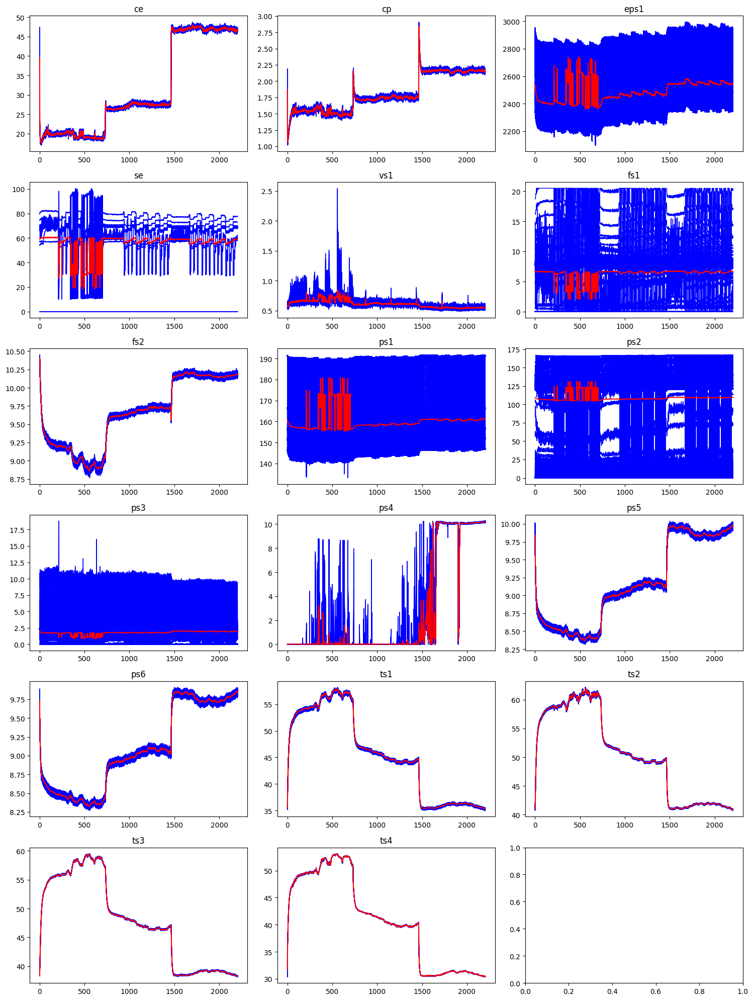

In [ ]:
plot.create_subplot()

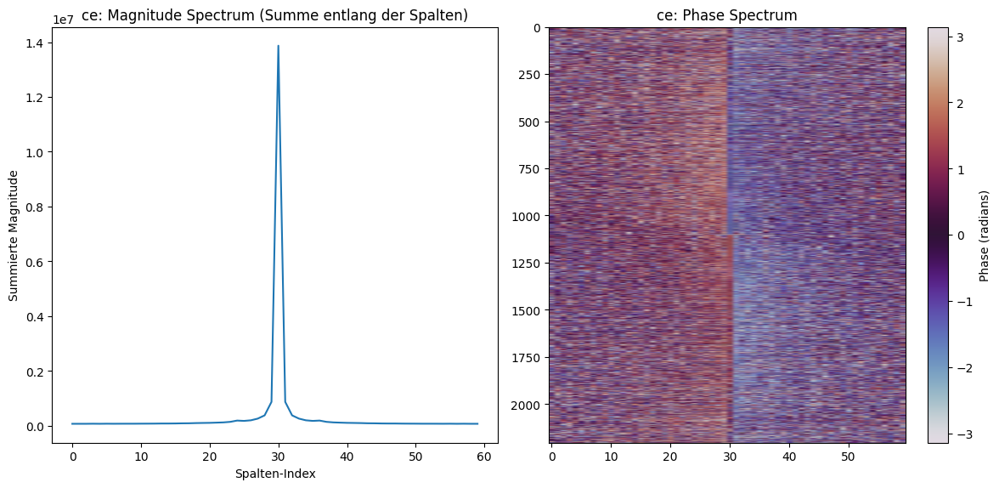

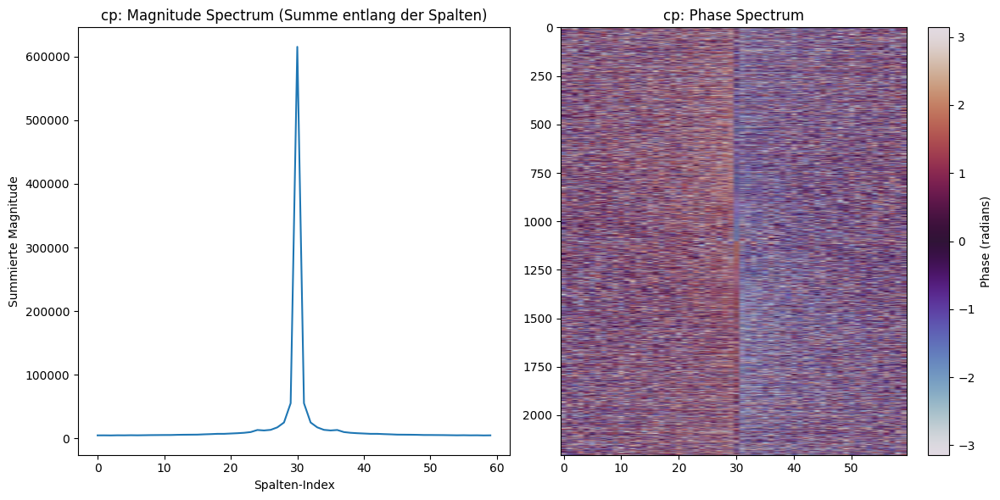

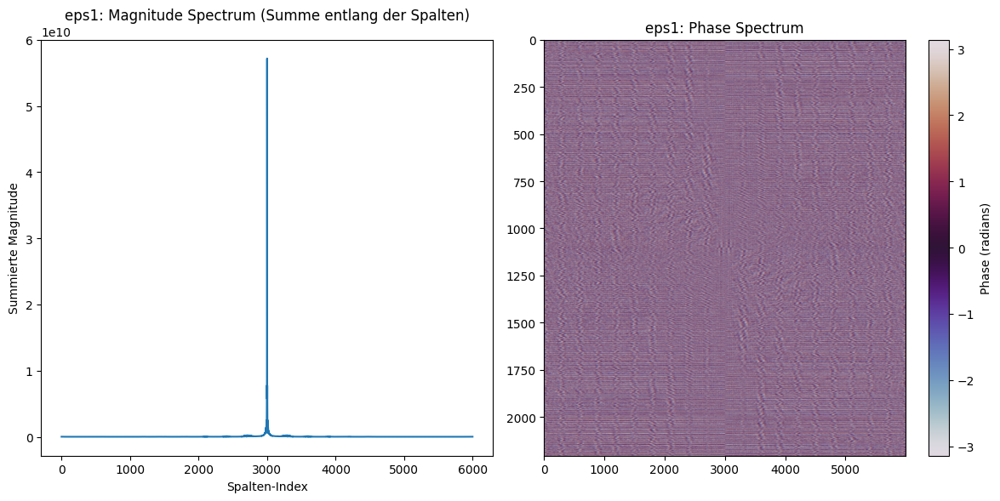

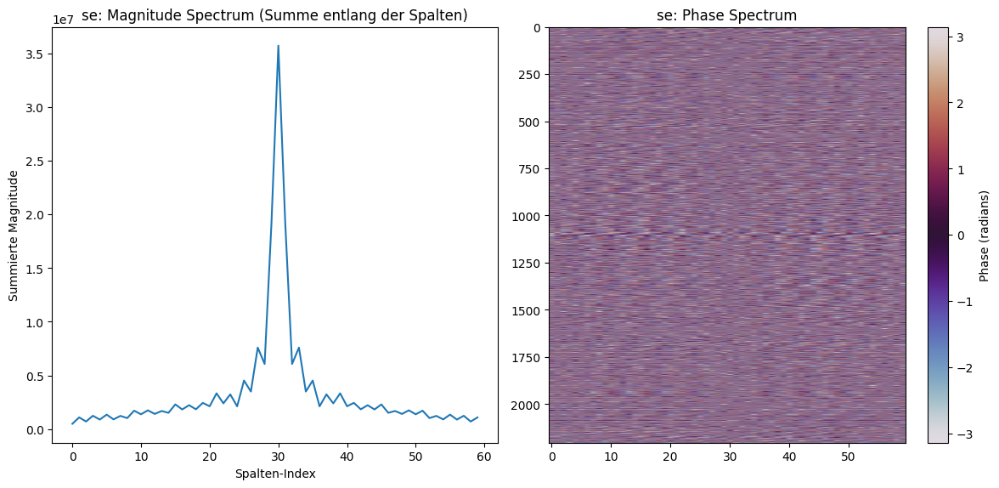

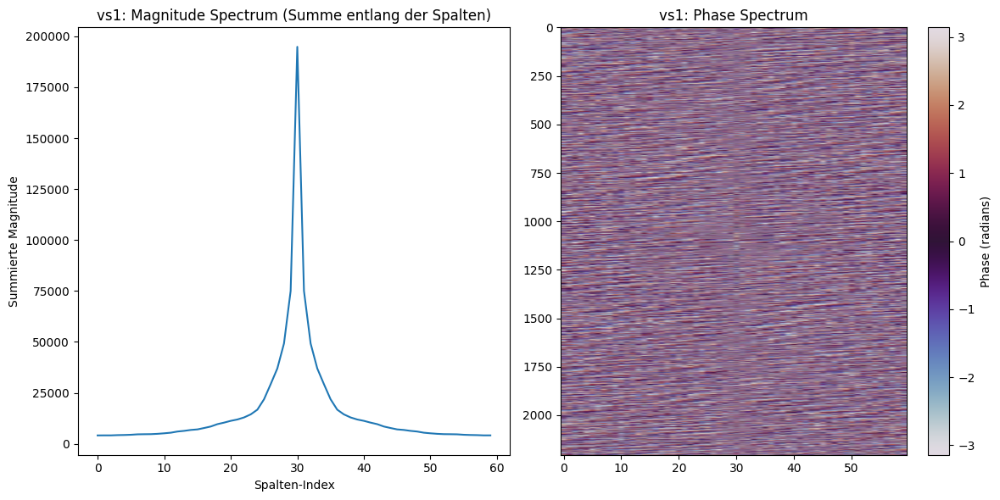

...

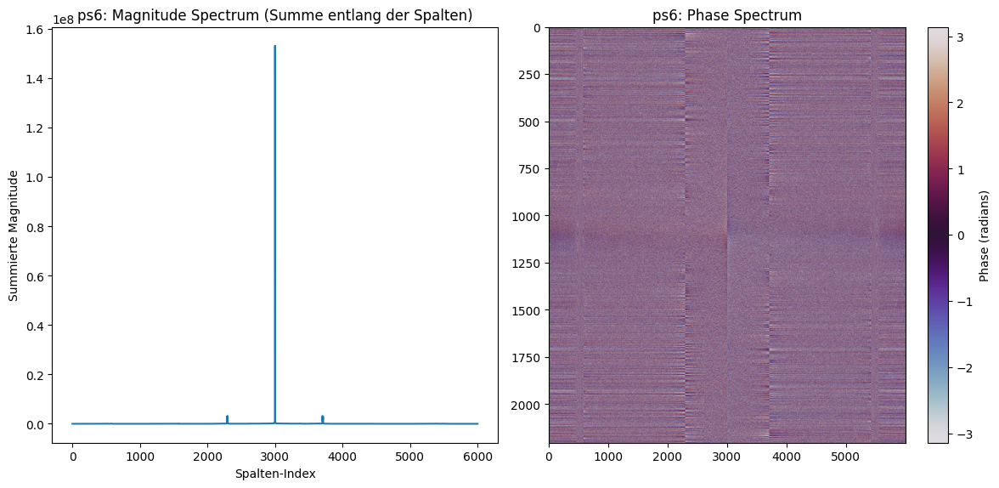

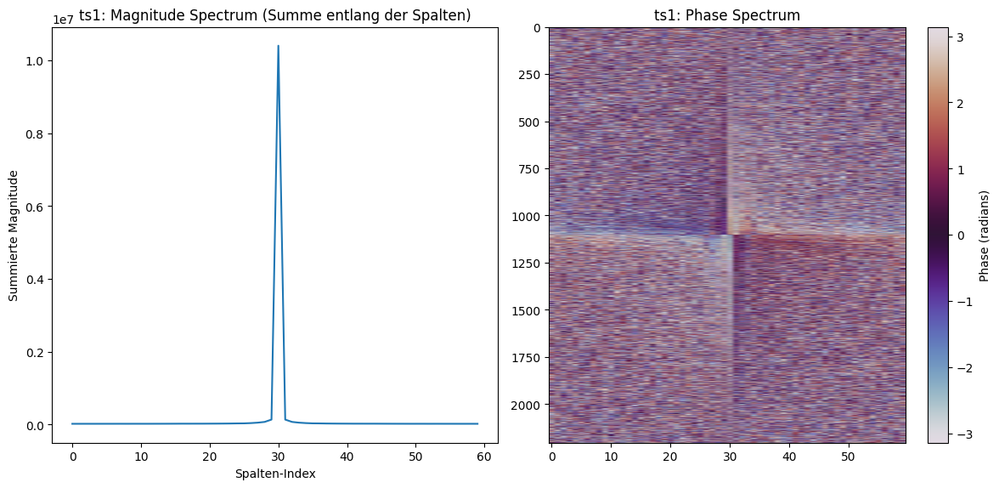

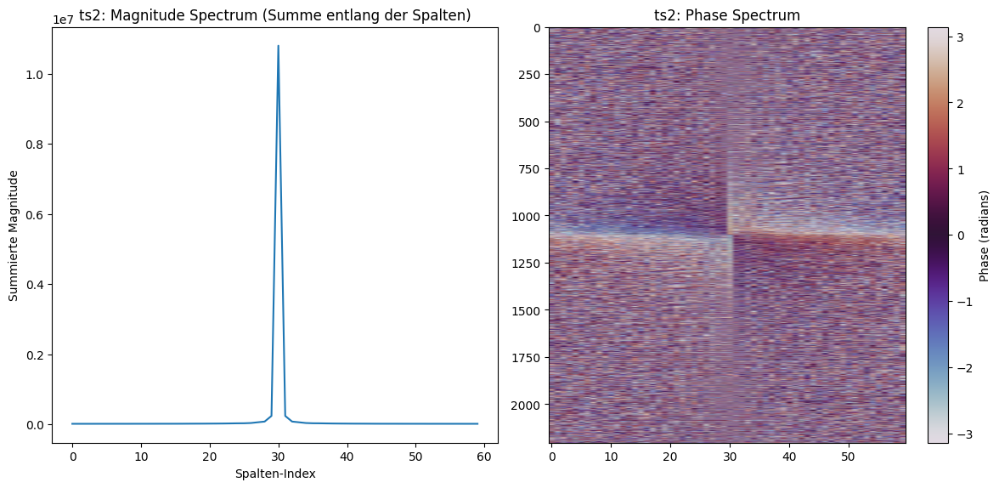

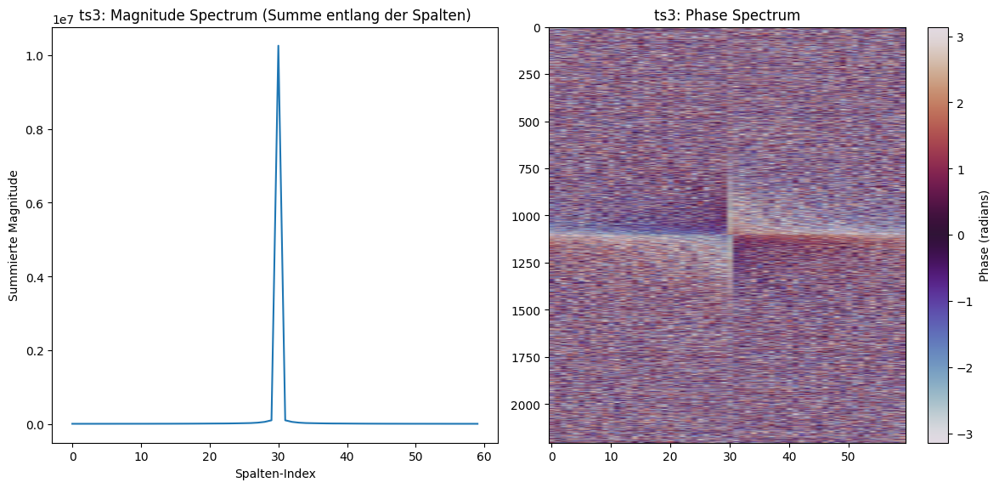

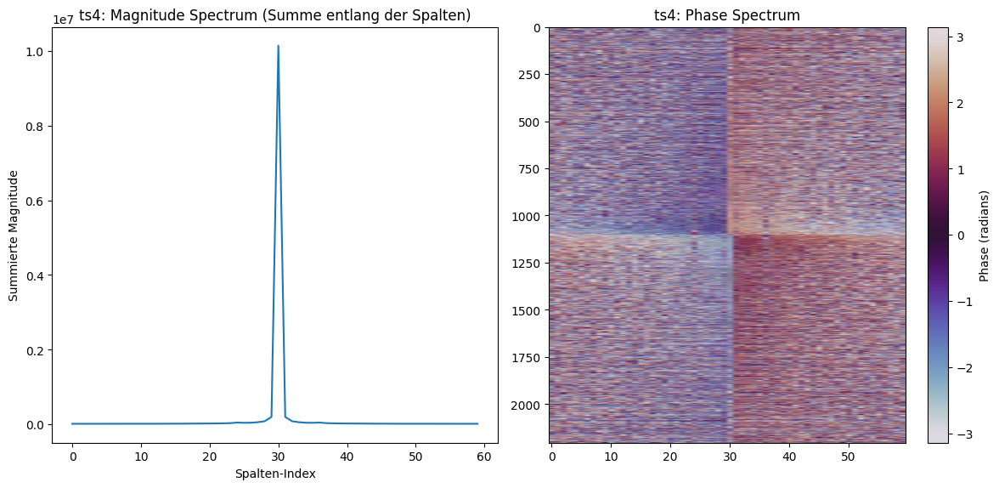

In [ ]:
plot.create_fft_plot()

Reading files...
Files read:
ce: (2205, 60)
cp: (2205, 60)
eps1: (2205, 6000)
se: (2205, 60)
vs1: (2205, 60)
fs1: (2205, 600)
fs2: (2205, 600)
ps1: (2205, 6000)
ps2: (2205, 6000)
ps3: (2205, 6000)
ps4: (2205, 6000)
ps5: (2205, 6000)
ps6: (2205, 6000)
ts1: (2205, 60)
ts2: (2205, 60)
ts3: (2205, 60)
ts4: (2205, 60)
target: (2205, 5)


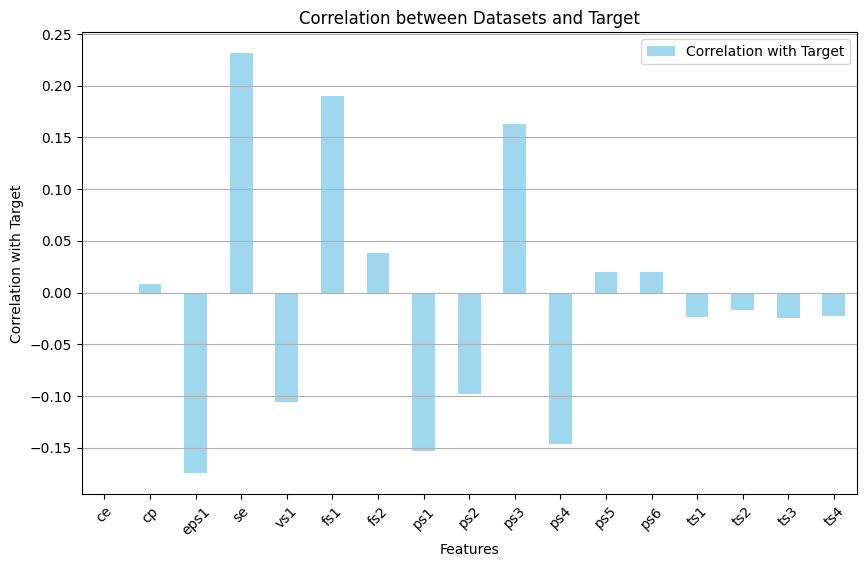

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Function to plot correlation with target
def plot_correlation_with_target(data, df_target):
    # Combine all the datasets into a single DataFrame
    combined_data = pd.DataFrame()

    # Add each dataset to the combined DataFrame
    for key, df in data.items():
        if key != 'target':  # Don't include the target in the combined dataset
            combined_data[key] = df.mean(axis=1)  # Aggregating by taking the mean of each row
    
    # Add the target column to the combined dataset
    combined_data['target'] = df_target  # Now using the df_target for correlation
    
    # Calculate the correlation matrix
    correlation_matrix = combined_data.corr()

    # Extract only the correlation values between the target and other columns
    target_correlation = correlation_matrix['target'].drop('target')  # Remove self-correlation
    
    # Create a bar plot for correlation values with the target
    plt.figure(figsize=(10, 6))
    target_correlation.plot(kind='bar', color='skyblue', alpha=0.8, label='Correlation with Target')
    
    # Set the title and labels
    plt.title('Correlation between Datasets and Target')
    plt.xlabel('Features')
    plt.ylabel('Correlation with Target')
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    
    # Show legend
    plt.legend()
    
    plt.show()

# Execute the process and plot
data, df_target = process_data()  # This will load the data and the target column
plot_correlation_with_target(data, df_target)  # Visualize the correlation


In [ ]:
for key, array in data.items():
    print(f"{key}: Mean = {round((np.mean(array)),4)}, Std = {round((np.std(array)),4)}, Min = {np.min(array)}, Max = {np.max(array)}")

ce: Mean = 31.2991, Std = 11.5779, Min = 17.042, Max = 48.777
cp: Mean = 1.8084, Std = 0.2793, Min = 1.016, Max = 2.909
eps1: Mean = 2495.5092, Std = 218.2222, Min = 2097.8, Max = 2995.2
se: Mean = 55.2879, Std = 25.6422, Min = 0.0, Max = 100.6
vs1: Mean = 0.6133, Std = 0.0805, Min = 0.483, Max = 2.546
fs1: Mean = 6.1985, Std = 3.2138, Min = 0.0, Max = 20.479
fs2: Mean = 9.6495, Std = 0.4495, Min = 8.764, Max = 10.453
ps1: Mean = 160.4853, Std = 16.1333, Min = 133.13, Max = 191.92
ps2: Mean = 109.3799, Std = 48.1032, Min = 0.0, Max = 167.77
ps3: Mean = 1.7532, Std = 0.9347, Min = 0.0, Max = 18.828
ps4: Mean = 2.6003, Std = 4.2976, Min = 0.0, Max = 10.266
ps5: Mean = 9.1633, Std = 0.5766, Min = 8.318, Max = 10.041
ps6: Mean = 9.0794, Std = 0.5499, Min = 8.268, Max = 9.91
ts1: Mean = 45.4246, Std = 7.9925, Min = 34.984, Max = 58.207
ts2: Mean = 50.366, Std = 7.3956, Min = 40.707, Max = 62.176
ts3: Mean = 47.6621, Std = 7.4506, Min = 38.145, Max = 59.539
ts4: Mean = 40.7357, Std = 8.1063,

In [12]:


class DataDiagnostics(DataProcessor):
    def __init__(self, input_path, file_names):
        super().__init__(input_path, file_names)  # Pass arguments to the parent class
        self.df = self.process_data()  # Process data and store as DataFrame
        self.df_standardized = None

    def process_data(self):
        """Process the data by loading and reading files."""
        df_list = []
        for file_name in self.file_names:
            file_path = os.path.join(self.input_path, f"{file_name}.txt")
            df = pd.read_csv(file_path, delimiter='\t')  # Assuming tab-separated files
            df_list.append(df)
        
        # Concatenate all DataFrames into one
        df_features = pd.concat(df_list, axis=1)  # Concatenate along columns
        print(f"Data loaded. Shape of the DataFrame: {df_features.shape}")
        return df_features

    def check_outliers_zscore(self, threshold=3):
        """Check for outliers using Z-score."""
        z_scores = np.abs(zscore(self.df))
        outliers = (z_scores > threshold).any(axis=1)
        print(f"Number of outliers (Z-score > {threshold}): {np.sum(outliers)}")
        return outliers

   

    def check_skewness(self):
        """Check the skewness of the dataset."""
        skewness = self.df.skew()
        print(f"Skewness of each feature:\n{skewness}")
        return skewness


    def fast_corr(self):
        """Optimized correlation calculation using NumPy."""
        print("Calculating correlation matrix using NumPy...")
        data = self.df.values  # Convert DataFrame to NumPy array
        corr_matrix = np.corrcoef(data.T)  # Transpose and compute correlation
        corr_df = pd.DataFrame(corr_matrix, index=self.df.columns, columns=self.df.columns)
        print("Correlation matrix calculated.")
        return corr_df

    def check_correlations(self):
        """Check and visualize correlations."""
        corr_matrix = self.fast_corr()
        print(f"Correlation matrix:\n{corr_matrix}")

        # Visualize the correlation matrix
        plt.figure(figsize=(12, 8))
        sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
        plt.title("Correlation Matrix")
        plt.show()

diagnostics = DataDiagnostics(input_path, file_names)

# Perform diagnostics
diagnostics.check_outliers_zscore()
diagnostics.check_skewness()



Data loaded. Shape of the DataFrame: (2204, 43685)
Number of outliers (Z-score > 3): 1700
Skewness of each feature:
47.202    0.471335
47.273    0.470346
47.25     0.469572
47.332    0.469634
47.213    0.470228
            ...   
3         0.609992
100      -0.568583
0         0.673785
130       0.310863
1         0.663969
Length: 43685, dtype: float64


47.202    0.471335
47.273    0.470346
47.25     0.469572
47.332    0.469634
47.213    0.470228
            ...   
3         0.609992
100      -0.568583
0         0.673785
130       0.310863
1         0.663969
Length: 43685, dtype: float64

In [15]:
class ManualFeatureExtractor:
    def __init__(self, dataset):
        self.dataset = dataset
        
    def extract_features(self):
        features = {}
        for i, key in enumerate(self.dataset, start=1):
            #features[f"{key}_{i}_mean"] = self.dataset[key].mean(axis=1)
            #features[f"{key}_{i}_median"] = np.median(self.dataset[key], axis=1)
            features[f"{key}_{i}_std"] = self.dataset[key].std(axis=1)
            #features[f"{key}_{i}_min"] = self.dataset[key].min(axis=1)
            #features[f"{key}_{i}_max"] = self.dataset[key].max(axis=1)
            #features[f"{key}_{i}_range"] = self.dataset[key].max(axis=1) - self.dataset[key].min(axis=1)
        self.df_features = pd.DataFrame(features)
        return self.df_features

extractor = ManualFeatureExtractor(data)
df_features = extractor.extract_features()

In [16]:
print(df_features.shape, df_target.shape)

(2205, 17) (2205,)


In [17]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

class ModelBuilder:
    def __init__(self, features, target):
        self.features = features
        self.target = target
    
    def split_data(self):
        X_train, X_test, y_train, y_test = train_test_split(
            self.features, self.target, test_size=0.2, random_state=42
        )
        return X_train, X_test, y_train, y_test
    
    def build_model(self):
        X_train, X_test, y_train, y_test = self.split_data()
        
        model = AdaBoostClassifier(
            estimator=DecisionTreeClassifier(max_depth=1),
            n_estimators=50,
            random_state=42
        )
        
        model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        print(f"Accuracy: {accuracy}")
        print(classification_report(y_test, y_pred))
    
        return model 




In [ ]:
X = df_features
Y = df_target
builder = ModelBuilder(X,Y)
model = builder.build_model()

Accuracy: 0.5918367346938775
              precision    recall  f1-score   support

        73.0       0.45      0.28      0.35        88
        80.0       0.46      0.46      0.46        67
        90.0       0.56      0.34      0.42        80
       100.0       0.66      0.86      0.75       206

    accuracy                           0.59       441
   macro avg       0.53      0.49      0.49       441
weighted avg       0.57      0.59      0.57       441



Merker für nach Urlaub: Datensätze von Sensoren, die mehrere Aufzeichnungen haben, zusammenführen, um einen großen Datensatz zu erhalten. Daraus dann wieder Standardabweichungen berechnen und in das Modell geben